In [1]:
pip install -q cleanvision

Note: you may need to restart the kernel to use updated packages.


In [2]:
from typing import Tuple

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sb
import tensorflow as tf
from cleanvision import Imagelab
from matplotlib import ticker
from PIL import Image
from sklearn import metrics
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# For reproducability
SEED = 51432
tf.keras.utils.set_random_seed(SEED)
tf.config.experimental.enable_op_determinism()

# Customize matplotlib graphs
plt.rc("axes.spines", right=False, top=False)
plt.rc("font", family="serif", size=10.5)

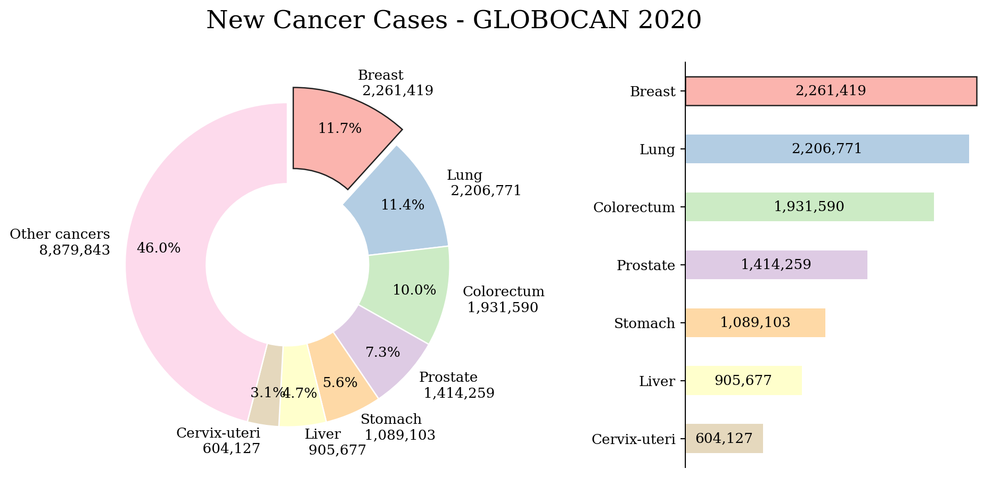

In [3]:
cancer_data = pd.Series({
    "Breast": 2261419,
    "Lung": 2206771,
    "Colorectum": 1931590,
    "Prostate": 1414259,
    "Stomach": 1089103,
    "Liver": 905677,
    "Cervix-uteri": 604127,
    "Other cancers": 8879843
})
fig, axes = plt.subplot_mosaic("aab", figsize=(14, 5.5), dpi=180)
fig.suptitle("New Cancer Cases - GLOBOCAN 2020", size=19, weight=500)
pie_chart = cancer_data.plot.pie(colors=plt.colormaps["Pastel1"].colors, startangle=90,
                                 autopct=lambda x: f"{x:.1f}%", pctdistance=0.8,
                                 explode=[0.1] + [0]*7, counterclock=False,
                                 ax=axes["a"], wedgeprops=dict(width=0.5, edgecolor='w'),
                                 labels=[f"{kind}\n {count:,}" 
                                         for kind, count in cancer_data.items()])
axes["a"].axis("off")

cancer_data_specific = cancer_data.drop("Other cancers").sort_values()
bar_chart = cancer_data_specific.plot.barh(ax=axes["b"],
                                           color=plt.colormaps["Pastel1"].colors[-3:: -1])
bar_chart.bar_label(bar_chart.containers[0], [f"{x:,}" for x in cancer_data_specific],
             label_type="center"
)
axes["b"].spines["bottom"].set_visible(False)
axes["a"].patches[0].set_edgecolor("#222")
axes["b"].patches[-1].set_edgecolor("#222")
axes["b"].xaxis.set_visible(False);

In [4]:
fold_info = pd.read_csv('D:\\breastCancer\\Folds.csv')
fold_info["label"] = fold_info["filename"].str.extract("(malignant|benign)")
fold_info.head()

,fold,mag,grp,filename,label
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign


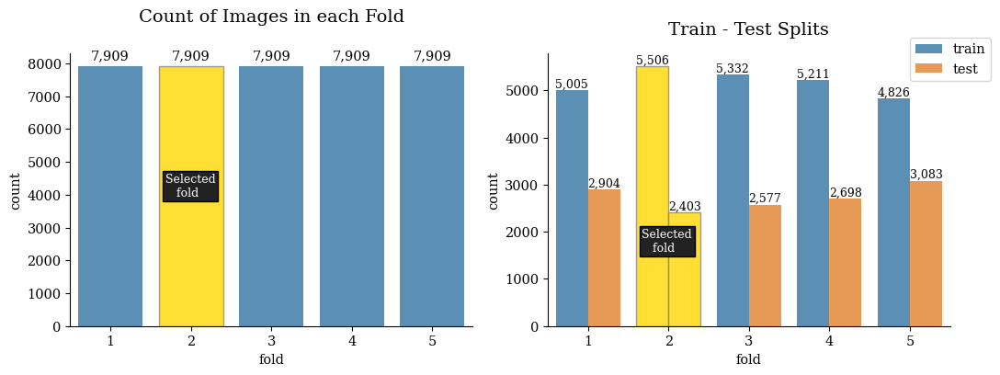

In [5]:
selected_fold = 2
selected_fold_data = fold_info.query("fold == @selected_fold")\
                              .copy().reset_index(drop=True)
selected_fold_data["filename"] = ('D:\\breastCancer\\BreaKHis_v1\\'
                                  + selected_fold_data["filename"])
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(11, 4.2), tight_layout=True)
# Plot image count in each fold
sb.countplot(data=fold_info, x="fold", color="C0", ax=ax1, alpha=0.8)
bars = ax1.containers[0]
ax1.bar_label(bars, padding=3,
             labels=[f"{x:,.0f}" for x in bars.datavalues])
_selected_bar = bars[selected_fold - 1]
_selected_bar.set_facecolor("gold")
_selected_bar.set_edgecolor("#888")
ax1.text(_selected_bar.get_x() + 0.08, _selected_bar.get_height() / 2,
         "Selected\n   fold", size=9, color="#fff",
         bbox={"pad": 2, "facecolor": "#222"})
ax1.set_title("Count of Images in each Fold", size=14, pad=25)

# Plot train-test split
sb.countplot(data=fold_info, x="fold", hue="grp", palette="tab10",
              ax=ax2, alpha=0.8)
for bars in ax2.containers:
    ax2.bar_label(bars, [f"{x:,.0f}" for x in bars.datavalues], size=9)
    bars[selected_fold - 1].set_facecolor("gold")
    bars[selected_fold - 1].set_edgecolor("#888")
ax2.text(_selected_bar.get_x() + 0.07, _selected_bar.get_height() / 5,
         "Selected\n   fold", size=9, color="#fff",
         bbox={"pad": 2, "facecolor": "#222"})
ax2.set_title("Train - Test Splits", size=14, pad=15)
ax2.legend(loc=(0.9, 0.9));

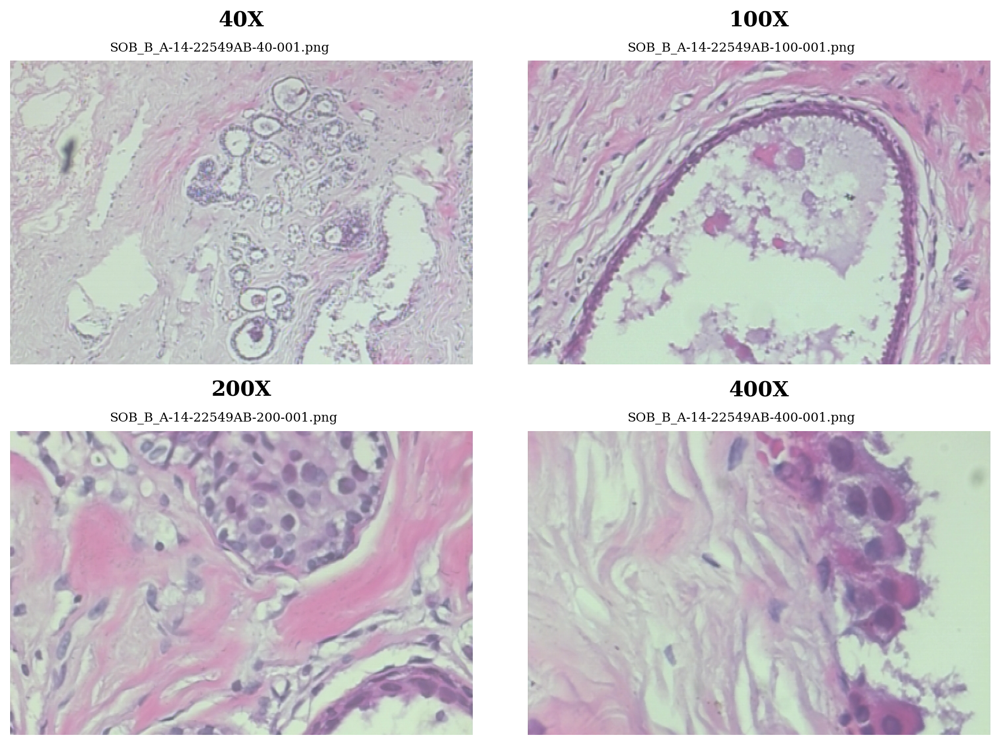

In [6]:
fig, axes = plt.subplots(2, 2, figsize=(11, 7.5), dpi=180, tight_layout=True)
sample_images = selected_fold_data.groupby("mag", as_index=False).first()
for ax, row in zip(axes.flat, sample_images.itertuples()):
    img = Image.open(row.filename)
    ax.imshow(img)
    ax.set_title(f"{row.mag}X", size=15, pad=25, weight=600)
    ax.text(150, -15, row.filename.split("/")[-1], size=9)
    ax.axis("off")

Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale, odd_size images ...


  0%|          | 0/7909 [00:00<?, ?it/s]

  0%|          | 0/7909 [00:00<?, ?it/s]

Issue checks completed. 330 issues found in the dataset. To see a detailed report of issues found, use imagelab.report().
Issues found in images in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  0 | exact_duplicates |          250 |
|  1 | odd_size         |           74 |
|  2 | near_duplicates  |            6 |
|  3 | blurry           |            0 |
|  4 | dark             |            0 |
|  5 | grayscale        |            0 |
|  6 | light            |            0 |
|  7 | low_information  |            0 |
|  8 | odd_aspect_ratio |            0 | 

----------------- exact_duplicates images ------------------

Number of examples with this issue: 250
Examples representing most severe instances of this issue:

Set: 0


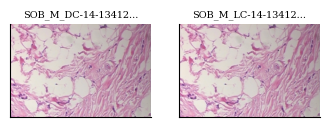

Set: 1


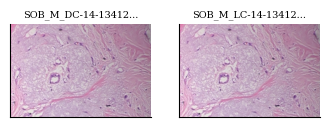

Set: 2


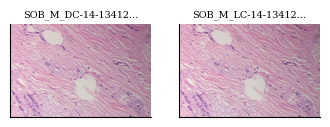

Set: 3


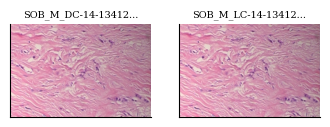

--------------------- odd_size images ----------------------

Number of examples with this issue: 74
Examples representing most severe instances of this issue:



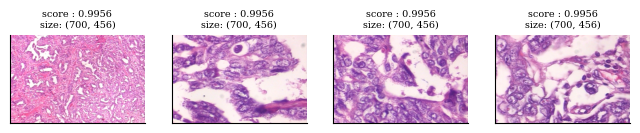

------------------ near_duplicates images ------------------

Number of examples with this issue: 6
Examples representing most severe instances of this issue:

Set: 0


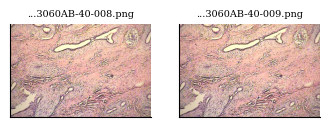

Set: 1


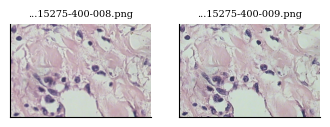

Set: 2


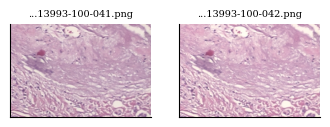

In [7]:
imagelab = Imagelab(filepaths=list(selected_fold_data["filename"]))
imagelab.find_issues()
imagelab.report(verbosity=4)

In [8]:
duplicated_images = imagelab.issues[
    ["is_exact_duplicates_issue", "is_near_duplicates_issue"]
].any(axis=1).reset_index().rename(columns={"index": "filename", 0: "duplicated"})
duplicated_images.head()

,filename,duplicated
0,D:\breastCancer\BreaKHis_v1\BreaKHis_v1/histol...,False
1,D:\breastCancer\BreaKHis_v1\BreaKHis_v1/histol...,False
2,D:\breastCancer\BreaKHis_v1\BreaKHis_v1/histol...,False
3,D:\breastCancer\BreaKHis_v1\BreaKHis_v1/histol...,False
4,D:\breastCancer\BreaKHis_v1\BreaKHis_v1/histol...,False


In [9]:
# Check that filenames align
assert duplicated_images["filename"].equals(selected_fold_data["filename"])
# Drop all duplicated images, then validate again 
selected_fold_data = selected_fold_data[~duplicated_images["duplicated"]]
imagelab = Imagelab(filepaths=list(selected_fold_data["filename"]))
imagelab.find_issues()

Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale, odd_size images ...


  0%|          | 0/7653 [00:00<?, ?it/s]

  0%|          | 0/7653 [00:00<?, ?it/s]

Issue checks completed. 74 issues found in the dataset. To see a detailed report of issues found, use imagelab.report().


In [10]:
# Use data in selected fold (2) with magnification factor >= 200X
train = selected_fold_data.query("mag >= 200 and grp == 'train'")
test = selected_fold_data.query("mag >= 200 and grp == 'test'")
train.shape, test.shape 

((2566, 5), (1149, 5))

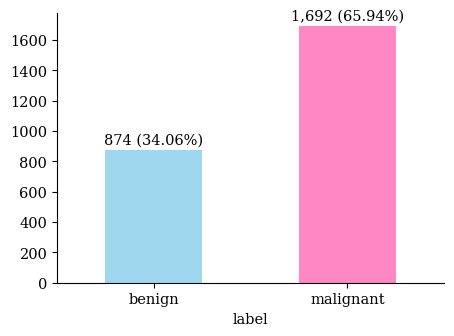

In [11]:
classes = dict(benign=0, malignant=1)
class_names = list(classes.keys())
label_counts = train["label"].value_counts(ascending=True)
ax = label_counts.plot.bar(color=["skyblue", "hotpink"], alpha=0.8,
                           figsize=(5, 3.5))
ax.bar_label(ax.containers[0], padding=2,
             labels=[f"{x:,} ({x/len(train):.2%})" for x in label_counts])
ax.set_xticklabels(["benign", "malignant"], rotation=0);

In [12]:
y = train["label"].map(classes)
positive_only_preds = np.ones_like(y)
print(f"Accuracy: {metrics.accuracy_score(y, positive_only_preds):.2%}",
      f"\nROC-AUC:  {metrics.roc_auc_score(y, positive_only_preds):.2%}")

Accuracy: 65.94% 
ROC-AUC:  50.00%


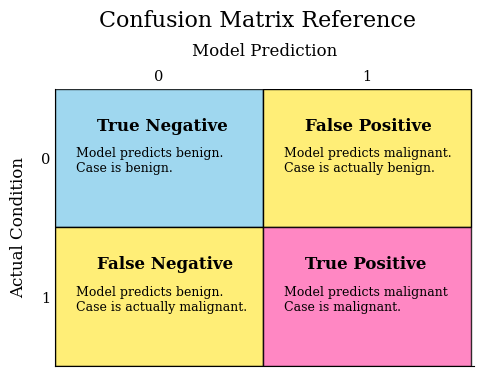

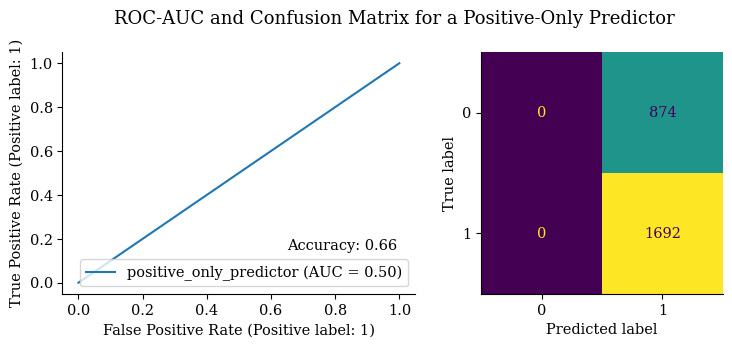

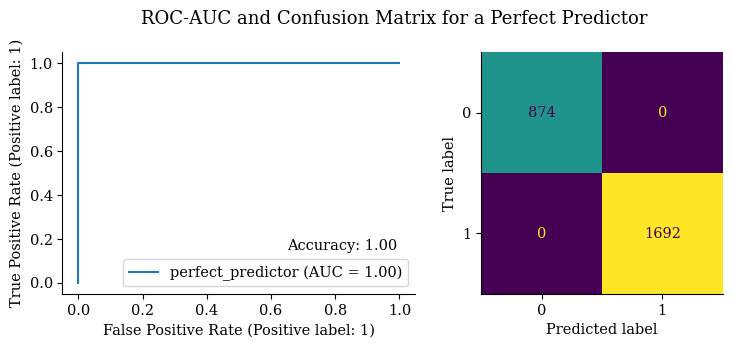

In [13]:
# Draw a confusion matrix with descriptions
fig, ax = plt.subplots(figsize=(5.4, 3.6))
ax.axvspan(0, 0.5, 0.5, 1, facecolor="skyblue", alpha=0.8, edgecolor="black")
ax.axvspan(0.5, 1, 0.5, 1, facecolor="#fe7", edgecolor="black")
ax.axvspan(0, 0.5, 0, 0.5, facecolor="#fe7", edgecolor="black")
ax.axvspan(0.5, 1, 0, 0.5, facecolor="hotpink", alpha=0.8, edgecolor="black")
ax.text(0.1, 0.85, "True Negative", size=12, weight=600)
ax.text(0.05, 0.7, "Model predicts benign.\nCase is benign.", size=9)
ax.text(0.6, 0.85, "False Positive", size=12, weight=600)
ax.text(0.55, 0.7, "Model predicts malignant.\nCase is actually benign.", size=9)
ax.text(0.1, 0.35, "False Negative", size=12, weight=600)
ax.text(0.05, 0.2, "Model predicts benign.\nCase is actually malignant.", size=9)
ax.text(0.6, 0.35, "True Positive", size=12, weight=600)
ax.text(0.55, 0.2, "Model predicts malignant\nCase is malignant.", size=9)
ax.set_xlim(0, 1.005)
ax.xaxis.set_major_locator(ticker.FixedLocator([0.25, 0.75]))
ax.xaxis.set_ticklabels([0, 1])
ax.yaxis.set_major_locator(ticker.FixedLocator([0.25, 0.75]))
ax.yaxis.set_ticklabels([1, 0])
ax.set_ylabel("Actual Condition", size=12, labelpad=10)
ax.set_xlabel("Model Prediction", size=12, labelpad=10)
ax.xaxis.set_label_position("top")
ax.xaxis.set_ticks_position("top")
ax.spines["left"].set_position("zero")
ax.tick_params(pad=0, top=False, left=False)
fig.suptitle("Confusion Matrix Reference", y=1.1, size=16)

# Plot metrics for positive-only-predictor
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8, 3.5), tight_layout=True)
metrics.RocCurveDisplay.from_predictions(y, positive_only_preds, ax=ax1,
                                         name="positive_only_predictor")
metrics.ConfusionMatrixDisplay.from_predictions(y, positive_only_preds,
                                                ax=ax2, colorbar=False)
ax1.text(0.65, 0.15,
         f"Accuracy: {metrics.accuracy_score(y, positive_only_preds):.2f}")
fig.suptitle("ROC-AUC and Confusion Matrix for a Positive-Only Predictor", size=13)

# Plot metrics for "perfect" predictor
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8, 3.5), tight_layout=True)
metrics.RocCurveDisplay.from_predictions(y, y, ax=ax1, name="perfect_predictor")
ax1.text(0.65, 0.15, f"Accuracy: {metrics.accuracy_score(y, y):.2f}")
metrics.ConfusionMatrixDisplay.from_predictions(y, y, ax=ax2, colorbar=False)
fig.suptitle("ROC-AUC and Confusion Matrix for a Perfect Predictor", size=13);

In [14]:
IMG_SIZE = 224
BATCH_SIZE = 28


def load_image(filename: str, label: int) -> Tuple[tf.Tensor, str]:
    file = tf.io.read_file(filename)
    img = tf.image.decode_png(file, channels=3)
    img = tf.image.resize_with_pad(img, IMG_SIZE, IMG_SIZE)
    return img, label


# Prepare training and validation datasets
X_train, X_valid, y_train, y_valid = train_test_split(
    train["filename"], train["label"].map(classes), random_state=SEED
)
train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))\
             .map(load_image).batch(BATCH_SIZE)
validation_ds = tf.data.Dataset.from_tensor_slices((X_valid, y_valid))\
                  .map(load_image).batch(BATCH_SIZE)
# Prepare test dataset
test = test.sample(frac=1, random_state=SEED)  # shuffle test data
test_ds = tf.data.Dataset.from_tensor_slices(
    (test["filename"], test["label"].map(classes))
).map(load_image).batch(BATCH_SIZE)

# Cache and prefetch data for faster training
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
validation_ds = validation_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

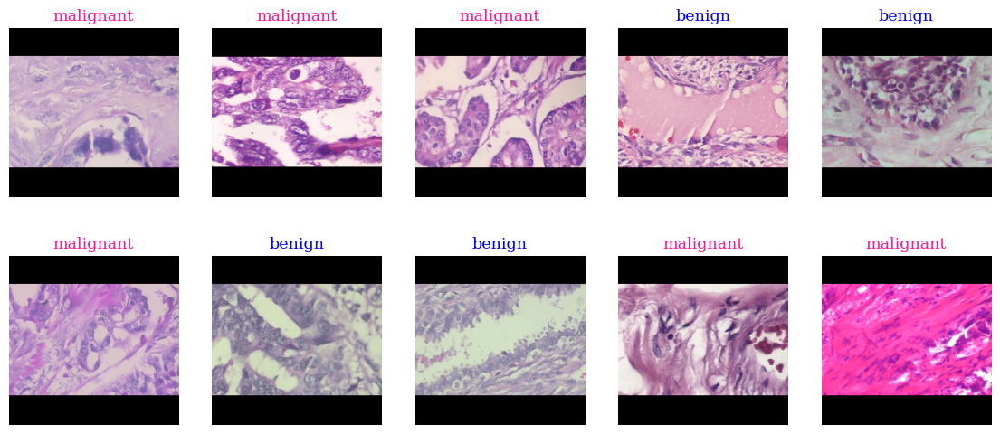

In [15]:
plt.figure(figsize=(14, 6))
for images, labels in train_ds.take(1):
    labels = labels.numpy()    
    for i in range(10):
        ax = plt.subplot(2, 5, i + 1)
        plt.imshow(images[i].numpy().astype(np.uint8))
        label = class_names[labels[i]]
        title_color = "blue" if label == "benign" else "deeppink"
        plt.title(class_names[labels[i]], color=title_color)
        plt.axis("off")

In [16]:
sample_image = load_image(*train[["filename", "label"]].iloc[0])[0]


def plot_augmentations(augmentation_layer: tf.keras.layers.Layer) -> None:
    augment_name = augmentation_layer.name
    fig, (ax0, *axes) = plt.subplots(ncols=4, figsize=(15, 4))
    ax0.imshow(sample_image.numpy().astype("uint8"))
    ax0.set_title("Original", size=14, pad=10)
    ax0.axis("off")
    for idx, ax in enumerate(axes):
        augmented_image = augmentation_layer(sample_image)
        ax.imshow(augmented_image.numpy().astype("uint8"))
        ax.set_title(augment_name.title(), size=14, pad=10)
        ax.axis("off")

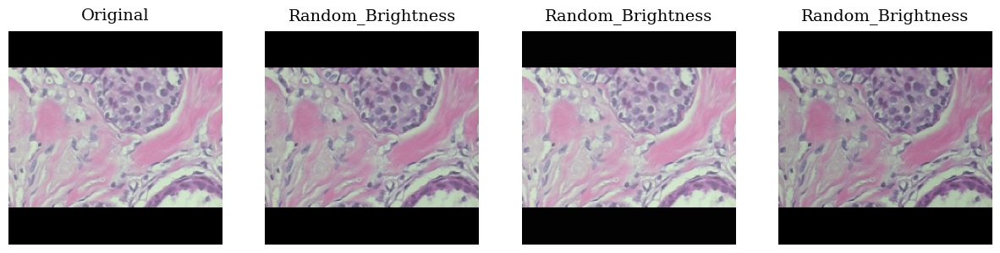

In [17]:
plot_augmentations(layers.RandomBrightness(0.2))

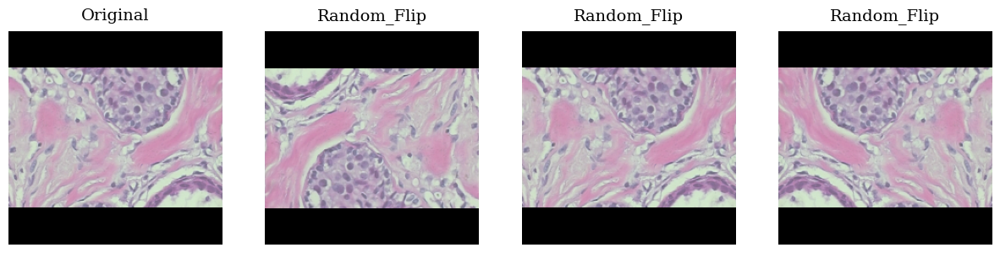

In [18]:
plot_augmentations(layers.RandomFlip())

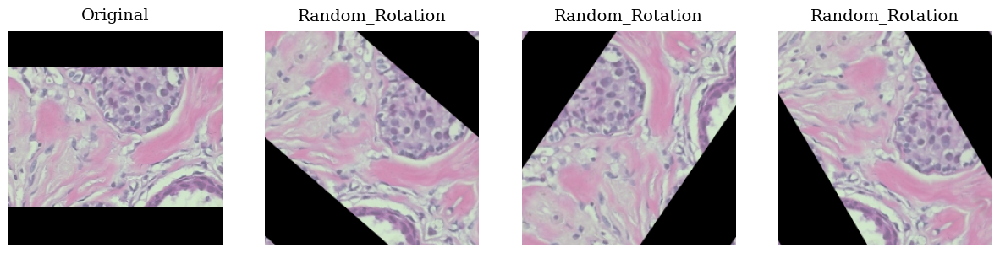

In [19]:
plot_augmentations(layers.RandomRotation(0.2, seed=SEED))

In [20]:
MAX_EPOCHS = 100
BASE_LEARNING_RATE = 0.001


def compile_and_fit_model(
    model: tf.keras.Model,
    learning_rate: float=BASE_LEARNING_RATE,
    epochs: int=MAX_EPOCHS
) -> tf.keras.callbacks.History:
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate),
        loss=tf.keras.losses.BinaryCrossentropy(),
        metrics=[tf.keras.metrics.AUC(name="roc_auc"), "binary_accuracy"]
    )
    early_stopping = EarlyStopping(min_delta=1e-4, patience=5, verbose=1,
                                   restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(factor=0.5, patience=4, verbose=1)
    history = model.fit(train_ds, validation_data=validation_ds,
                        epochs=epochs, callbacks=[early_stopping, reduce_lr])
    # Plot training metrics
    performance_df = pd.DataFrame(history.history)
    fig, axes = plt.subplots(ncols=2, figsize=(11, 4))
    for ax, metric in zip(axes.flat, ["Accuracy", "Loss"]):
        performance_df.filter(like=metric.lower()).plot(ax=ax)
        ax.set_title(metric, size=14, pad=10)
        ax.set_xlabel("epoch")
    return history


def evaluate_model(model: tf.keras.Model, dataset: tf.data.Dataset=test_ds) -> None:
    loss, auc, accuracy = model.evaluate(dataset, verbose=0)
    print(f"\nROC-AUC:   {auc:.5f}", 
          f"Accuracy:  {accuracy:.5f}",
          f"Loss:      {loss:.5f}\n", sep="\n")
    # Get labels and predictions for each batch in dataset
    results = [(labels, model.predict(images, verbose=0).reshape(-1))
               for images, labels in dataset.take(-1)]
    labels = np.concatenate([x[0] for x in results])
    preds = np.concatenate([x[1] for x in results])
    # Plot metrics
    fig, axes = plt.subplots(ncols=3, figsize=(15, 4), dpi=160)
    curves = [metrics.RocCurveDisplay, metrics.PrecisionRecallDisplay]
    for ax, curve in zip(axes[:2], curves):
        curve.from_predictions(labels, preds, ax=ax, name=model.name)
    metrics.ConfusionMatrixDisplay.from_predictions(
        labels, preds.round().astype("uint8"), ax=axes[2], colorbar=False,
    )
    titles = ["ROC-AUC Curve", "Precision-Recall Curve", "Confusion Matrix"]
    for ax, title in zip(axes.flat, titles):
        ax.set_title(title, size=14, pad=10)


def plot_predictions(model: tf.keras.Model) -> None:
    plt.figure(figsize=(14, 9))
    for images, labels in test_ds.take(1):
        labels = labels.numpy()
        predicted_labels = model.predict(images).round().astype("uint8").reshape(-1,)
        print("Predicted:", predicted_labels)
        print("Actual:   ", labels)
        for i, (pred, actual) in enumerate(zip(predicted_labels, labels)):
            ax = plt.subplot(4, 7, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            if pred == actual:
                plt.title(class_names[labels[i]], color="green", size=9)
            else:
                plt.title(f"{class_names[predicted_labels[i]]}\n"
                          + f"(Actual: {class_names[labels[i]]})",
                          color="red", size=9)
            plt.axis("off")
        

In [21]:
custom_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),
    # Convolutional block I
    layers.Rescaling(1./255),
    layers.BatchNormalization(),
    layers.Conv2D(32, 3, activation="relu"),
    layers.MaxPooling2D(),
    # Convolutional block II
    layers.Conv2D(64, 3, activation="relu"),
    layers.MaxPooling2D(),
    # Convolutional block III
    layers.Conv2D(128, 3, activation="relu"),
    layers.MaxPooling2D(),
    # Fully connected layers
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.4),
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(32, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(1, activation="sigmoid")
], name="CustomCNN")
custom_model.summary()

Model: "CustomCNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_brightness_1                  │ (None, 224, 224, 3)         │               0 │
│ (RandomBrightness)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip_1 (RandomFlip)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_1 (RandomRotation)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling (Rescaling)                │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 224, 224, 3)         │              12 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           8,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 134,541 (525.55 KB)

 Trainable params: 134,535 (525.53 KB)

 Non-trainable params: 6 (24.00 B)

Epoch 1/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - binary_accuracy: 0.6846 - loss: 0.5903 - roc_auc: 0.6674 - val_binary_accuracy: 0.7150 - val_loss: 0.5095 - val_roc_auc: 0.8702 - learning_rate: 0.0010
Epoch 2/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 111s 2s/step - binary_accuracy: 0.8249 - loss: 0.4885 - roc_auc: 0.8384 - val_binary_accuracy: 0.8505 - val_loss: 0.4338 - val_roc_auc: 0.8735 - learning_rate: 0.0010
Epoch 3/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 109s 2s/step - binary_accuracy: 0.8276 - loss: 0.4355 - roc_auc: 0.8603 - val_binary_accuracy: 0.8349 - val_loss: 0.4395 - val_roc_auc: 0.8798 - learning_rate: 0.0010
Epoch 4/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 108s 2s/step - binary_accuracy: 0.8491 - loss: 0.4120 - roc_auc: 0.8694 - val_binary_accuracy: 0.8427 - val_loss: 0.4014 - val_roc_auc: 0.8919 - learning_rate: 0.0010
Epoch 5/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 108s 2s/step - binary_accuracy: 0.8449 - loss: 0.4126 - roc_auc: 0.8685 - val_binary_accuracy: 0.8707 - val_loss: 0.3653 - val_roc_auc: 0

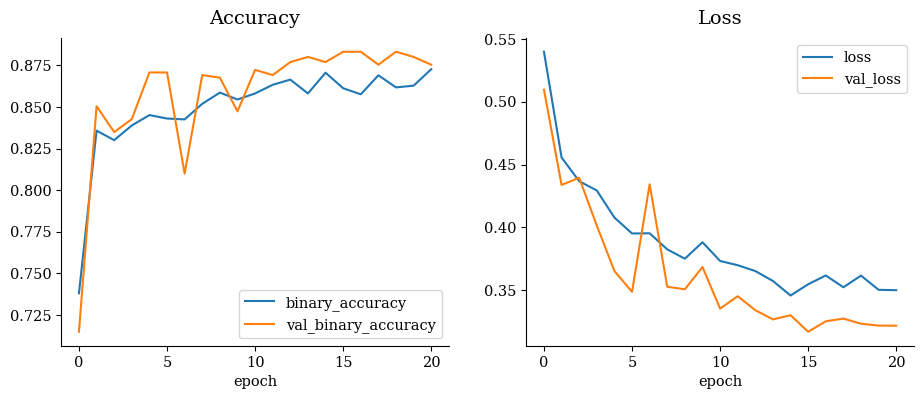

In [22]:
custom_history = compile_and_fit_model(custom_model)


ROC-AUC:   0.82570
Accuracy:  0.82768
Loss:      0.55176



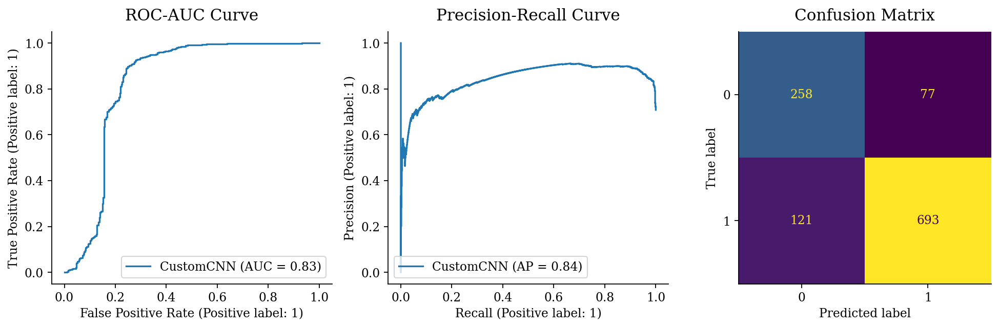

In [23]:
evaluate_model(custom_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step
Predicted: [1 1 1 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1]
Actual:    [1 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1 1 0 1 1]


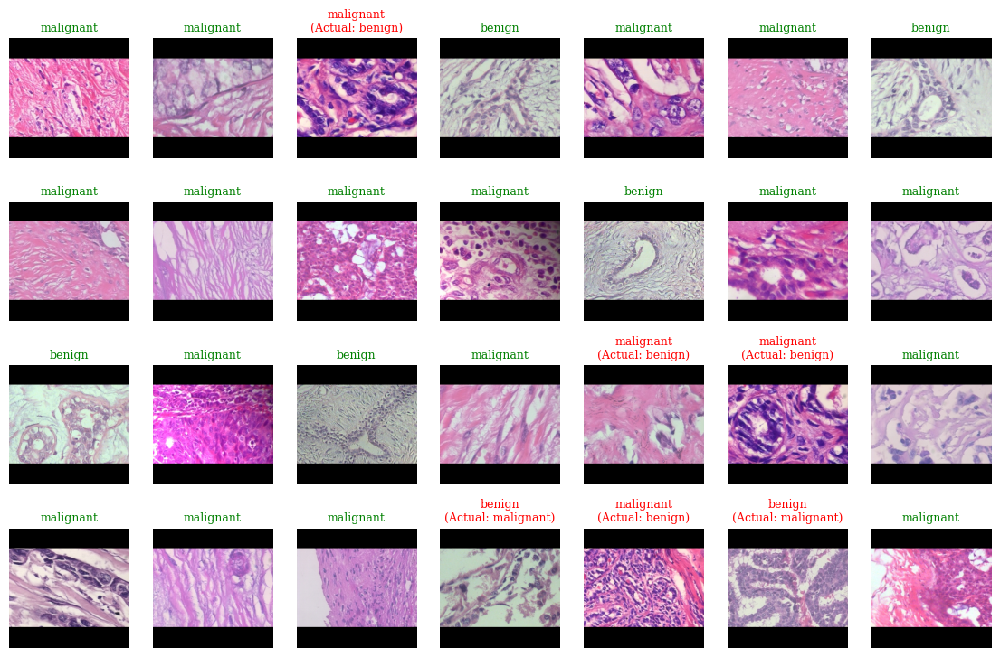

In [24]:
plot_predictions(custom_model)

In [25]:
pretrained_mobnet_base = tf.keras.applications.MobileNetV3Large(
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    weights="imagenet",
    pooling="avg",
)
pretrained_mobnet_base.trainable = False

mobnet_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),
    # MobileNet
    layers.Lambda(tf.keras.applications.mobilenet_v3.preprocess_input),
    pretrained_mobnet_base,
    layers.Dropout(0.4),
    # Fully connected layers
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(32, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(1, activation="sigmoid")
], name="MobileNetV3")
mobnet_model.summary()

Model: "MobileNetV3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_brightness_2                  │ (None, 224, 224, 3)         │               0 │
│ (RandomBrightness)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip_2 (RandomFlip)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_2 (RandomRotation)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda (Lambda)                      │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobilenetV3large (Functional)        │ (None, 960)                 │       2,996,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 256)                 │         246,016 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 32)                  │           8,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,250,625 (12.40 MB)

 Trainable params: 254,273 (993.25 KB)

 Non-trainable params: 2,996,352 (11.43 MB)

Epoch 1/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 70s 901ms/step - binary_accuracy: 0.6568 - loss: 0.6362 - roc_auc: 0.6528 - val_binary_accuracy: 0.7414 - val_loss: 0.4998 - val_roc_auc: 0.8114 - learning_rate: 0.0010
Epoch 2/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - binary_accuracy: 0.7406 - loss: 0.5327 - roc_auc: 0.7824 - val_binary_accuracy: 0.6994 - val_loss: 0.5237 - val_roc_auc: 0.8532 - learning_rate: 0.0010
Epoch 3/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 55s 797ms/step - binary_accuracy: 0.7487 - loss: 0.5261 - roc_auc: 0.7875 - val_binary_accuracy: 0.7399 - val_loss: 0.4786 - val_roc_auc: 0.8322 - learning_rate: 0.0010
Epoch 4/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 53s 769ms/step - binary_accuracy: 0.7539 - loss: 0.4884 - roc_auc: 0.8235 - val_binary_accuracy: 0.7679 - val_loss: 0.4406 - val_roc_auc: 0.8638 - learning_rate: 0.0010
Epoch 5/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 52s 759ms/step - binary_accuracy: 0.7754 - loss: 0.4652 - roc_auc: 0.8417 - val_binary_accuracy: 0.7773 - val_loss: 0.4479 - val_roc

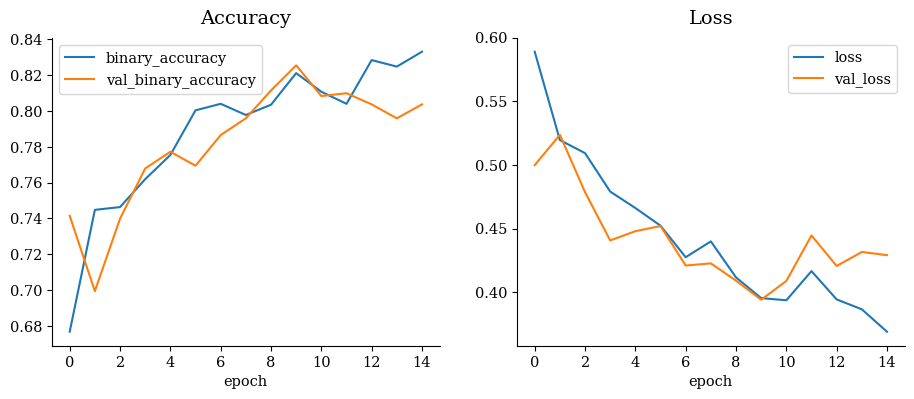

In [26]:
mobnet_history = compile_and_fit_model(mobnet_model)


ROC-AUC:   0.74243
Accuracy:  0.72672
Loss:      0.55209



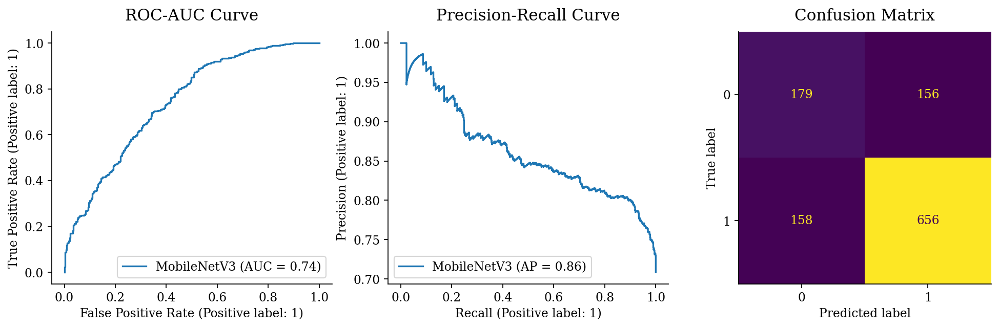

In [27]:
evaluate_model(mobnet_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 572ms/step
Predicted: [1 1 1 0 1 1 0 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 0 1 0 1]
Actual:    [1 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1 1 0 1 1]


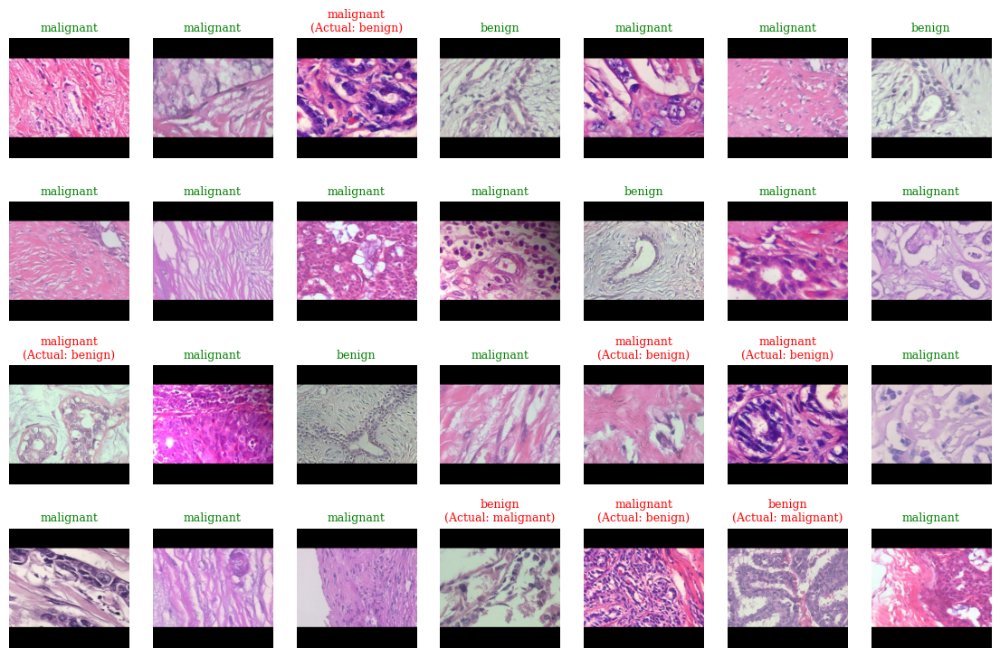

In [28]:
plot_predictions(mobnet_model)

In [29]:
pretrained_efficientnet_base = tf.keras.applications.efficientnet_v2.EfficientNetV2B1(
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    weights="imagenet",
    pooling="avg",
)
pretrained_efficientnet_base.trainable = False

efficientnet_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),
    # EfficientNet
    pretrained_efficientnet_base,
    layers.Dropout(0.4),
    # Fully connected layers
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(32, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(1, activation="sigmoid")
], name="EfficientNetB1")
efficientnet_model.summary()

Model: "EfficientNetB1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_brightness_3                  │ (None, 224, 224, 3)         │               0 │
│ (RandomBrightness)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip_3 (RandomFlip)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_3 (RandomRotation)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b1 (Functional)       │ (None, 1280)                │       6,931,124 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 256)                 │         327,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 32)                  │           8,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,267,317 (27.72 MB)

 Trainable params: 336,193 (1.28 MB)

 Non-trainable params: 6,931,124 (26.44 MB)

Epoch 1/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 136s 2s/step - binary_accuracy: 0.6767 - loss: 0.6000 - roc_auc: 0.6890 - val_binary_accuracy: 0.7414 - val_loss: 0.4613 - val_roc_auc: 0.9123 - learning_rate: 0.0010
Epoch 2/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 113s 2s/step - binary_accuracy: 0.7892 - loss: 0.4446 - roc_auc: 0.8495 - val_binary_accuracy: 0.8209 - val_loss: 0.3668 - val_roc_auc: 0.9268 - learning_rate: 0.0010
Epoch 3/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 116s 2s/step - binary_accuracy: 0.8367 - loss: 0.3958 - roc_auc: 0.8868 - val_binary_accuracy: 0.8598 - val_loss: 0.3467 - val_roc_auc: 0.9350 - learning_rate: 0.0010
Epoch 4/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 123s 2s/step - binary_accuracy: 0.8483 - loss: 0.3756 - roc_auc: 0.8983 - val_binary_accuracy: 0.8287 - val_loss: 0.3572 - val_roc_auc: 0.9413 - learning_rate: 0.0010
Epoch 5/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 118s 2s/step - binary_accuracy: 0.8539 - loss: 0.3533 - roc_auc: 0.9057 - val_binary_accuracy: 0.8411 - val_loss: 0.3311 - val_roc_auc: 0

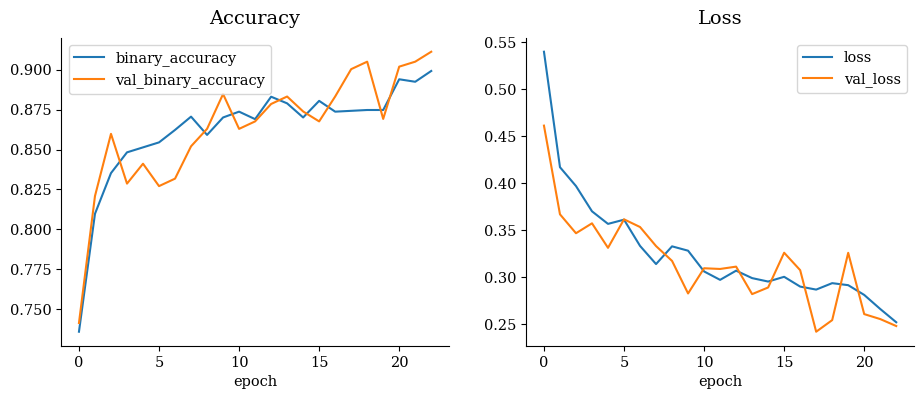

In [30]:
efficientnet_history = compile_and_fit_model(efficientnet_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
Predicted: [0 0 1 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 1 0 1 1 1 1 0 0 0 1]
Actual:    [1 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1 1 0 1 1]


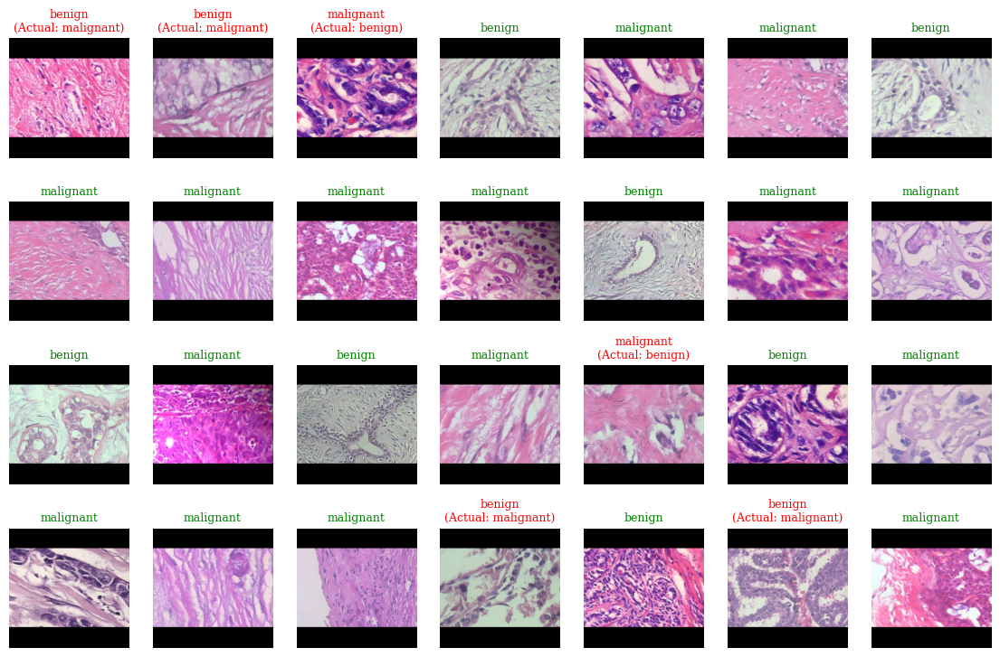

In [31]:
plot_predictions(efficientnet_model)


ROC-AUC:   0.87666
Accuracy:  0.79634
Loss:      0.44258



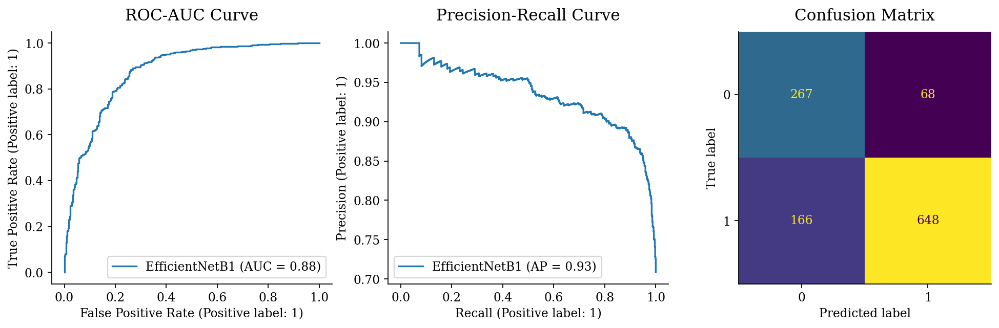

In [32]:
evaluate_model(efficientnet_model)

In [33]:
from tensorflow.keras.preprocessing import image_dataset_from_directory

In [34]:
# Load and preprocess data for LSTM model
def load_image_sequence(filename: str, label: int) -> Tuple[tf.Tensor, str]:
    file = tf.io.read_file(filename)
    img = tf.image.decode_png(file, channels=3)
    img = tf.image.resize_with_pad(img, IMG_SIZE, IMG_SIZE)
    img = tf.image.convert_image_dtype(img, tf.float32)
    return img, label

In [35]:
# Prepare datasets
def prepare_dataset(data, batch_size=BATCH_SIZE):
    dataset = tf.data.Dataset.from_tensor_slices((data["filename"], data["label"].map(classes)))
    dataset = dataset.map(load_image_sequence).batch(batch_size)
    dataset = dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
    return dataset

train_ds = prepare_dataset(train)
validation_ds = prepare_dataset(test)


In [36]:
# Define the LSTM model
def create_lstm_model(input_shape=(IMG_SIZE, IMG_SIZE, 3)):
    model = tf.keras.Sequential([
        layers.Input(shape=input_shape),
        # Data augmentation
        layers.RandomBrightness(0.2, seed=SEED),
        layers.RandomFlip(seed=SEED),
        layers.RandomRotation(0.2, seed=SEED),
        # Convolutional layers
        layers.Conv2D(32, 3, activation='relu'),
        layers.MaxPooling2D(),
        layers.Conv2D(64, 3, activation='relu'),
        layers.MaxPooling2D(),
        layers.Conv2D(128, 3, activation='relu'),
        layers.MaxPooling2D(),
        layers.GlobalAveragePooling2D(),
        layers.Reshape((1, 128)),
        # LSTM layers
        layers.LSTM(64, return_sequences=True),
        layers.LSTM(32),
        layers.Dense(1, activation='sigmoid')
    ])
    return model
lstm_model = create_lstm_model()
lstm_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_brightness_4                  │ (None, 224, 224, 3)         │               0 │
│ (RandomBrightness)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip_4 (RandomFlip)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_4 (RandomRotation)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 1, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 1, 64)               │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 155,105 (605.88 KB)

 Trainable params: 155,105 (605.88 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 160s 2s/step - binary_accuracy: 0.5920 - loss: 0.6834 - roc_auc: 0.3680 - val_binary_accuracy: 0.7084 - val_loss: 0.6283 - val_roc_auc: 0.5000 - learning_rate: 0.0010
Epoch 2/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - binary_accuracy: 0.6784 - loss: 0.6377 - roc_auc: 0.4180 - val_binary_accuracy: 0.7084 - val_loss: 0.6128 - val_roc_auc: 0.5000 - learning_rate: 0.0010
Epoch 3/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 140s 2s/step - binary_accuracy: 0.7283 - loss: 0.6029 - roc_auc: 0.2854 - val_binary_accuracy: 0.7084 - val_loss: 0.6116 - val_roc_auc: 0.5000 - learning_rate: 0.0010
Epoch 4/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 141s 2s/step - binary_accuracy: 0.6880 - loss: 0.6281 - roc_auc: 0.3174 - val_binary_accuracy: 0.7084 - val_loss: 0.6130 - val_roc_auc: 0.5000 - learning_rate: 0.0010
Epoch 5/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 137s 1s/step - binary_accuracy: 0.6412 - loss: 0.6549 - roc_auc: 0.4217 - val_binary_accuracy: 0.7084 - val_loss: 0.6085 - val_roc_auc: 0

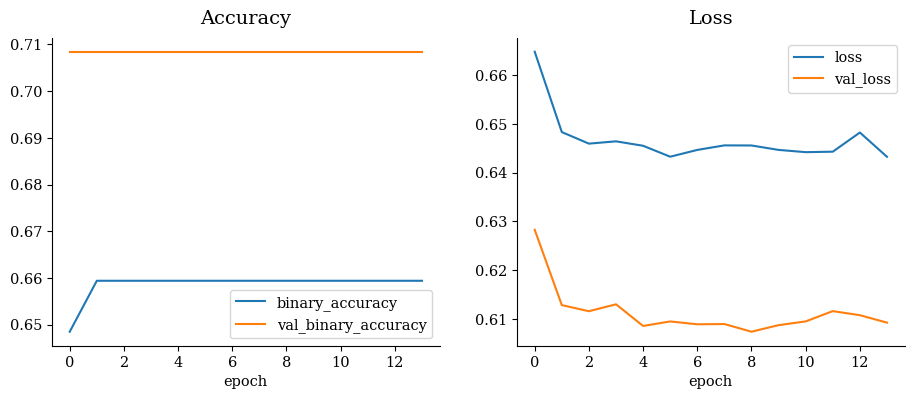

In [37]:
# Compile and fit the LSTM model
lstm_history = compile_and_fit_model(lstm_model)



ROC-AUC:   0.50000
Accuracy:  0.70844
Loss:      0.60736



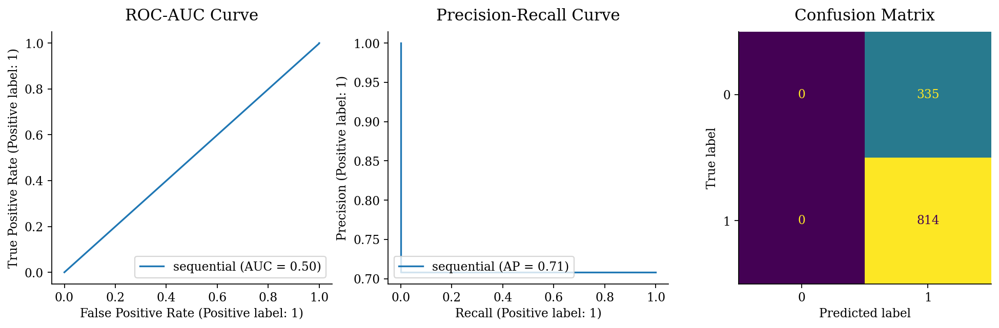

In [38]:
evaluate_model(lstm_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step
Predicted: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual:    [1 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1 1 0 1 1]


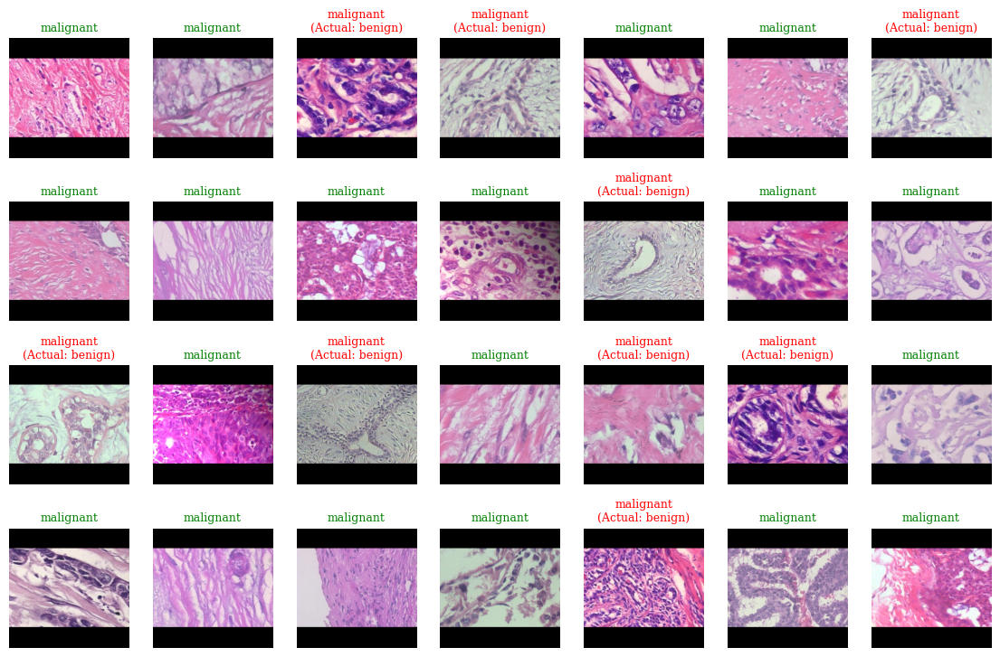

In [39]:
plot_predictions(lstm_model)

In [40]:
pretrained_vgg16_base = tf.keras.applications.vgg16.VGG16(
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    weights="imagenet",
    pooling="avg",
)
pretrained_vgg16_base.trainable = False

vgg16_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),
    # VGG16
    layers.Lambda(tf.keras.applications.vgg16.preprocess_input),
    pretrained_vgg16_base,
    layers.Dropout(0.4),
    # Fully connected layers
    layers.Dense(384, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(64, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(1, activation="sigmoid")
], name="VGG16")
vgg16_model.summary()

Model: "VGG16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_brightness_5                  │ (None, 224, 224, 3)         │               0 │
│ (RandomBrightness)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip_5 (RandomFlip)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_5 (RandomRotation)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda_1 (Lambda)                    │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg16 (Functional)                   │ (None, 512)                 │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 384)                 │         196,992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 384)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 64)                  │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,936,385 (56.98 MB)

 Trainable params: 221,697 (866.00 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1213s 13s/step - binary_accuracy: 0.6088 - loss: 1.4455 - roc_auc: 0.5929 - val_binary_accuracy: 0.7084 - val_loss: 0.6036 - val_roc_auc: 0.6803 - learning_rate: 0.0010
Epoch 2/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1223s 13s/step - binary_accuracy: 0.7067 - loss: 0.5905 - roc_auc: 0.5804 - val_binary_accuracy: 0.7102 - val_loss: 0.5624 - val_roc_auc: 0.7592 - learning_rate: 0.0010
Epoch 3/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1232s 13s/step - binary_accuracy: 0.6344 - loss: 0.6361 - roc_auc: 0.6606 - val_binary_accuracy: 0.7198 - val_loss: 0.5952 - val_roc_auc: 0.7765 - learning_rate: 0.0010
Epoch 4/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1216s 13s/step - binary_accuracy: 0.7365 - loss: 0.5365 - roc_auc: 0.7699 - val_binary_accuracy: 0.7885 - val_loss: 0.6301 - val_roc_auc: 0.8062 - learning_rate: 0.0010
Epoch 5/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1218s 13s/step - binary_accuracy: 0.7302 - loss: 0.5475 - roc_auc: 0.7819 - val_binary_accuracy: 0.8024 - val_loss: 0.5889 - val_

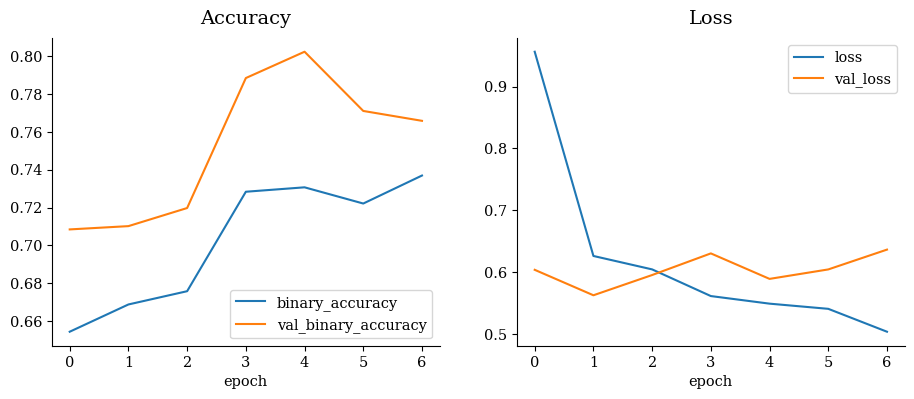

In [41]:
vgg16_history = compile_and_fit_model(vgg16_model)


ROC-AUC:   0.75920
Accuracy:  0.71018
Loss:      0.56242



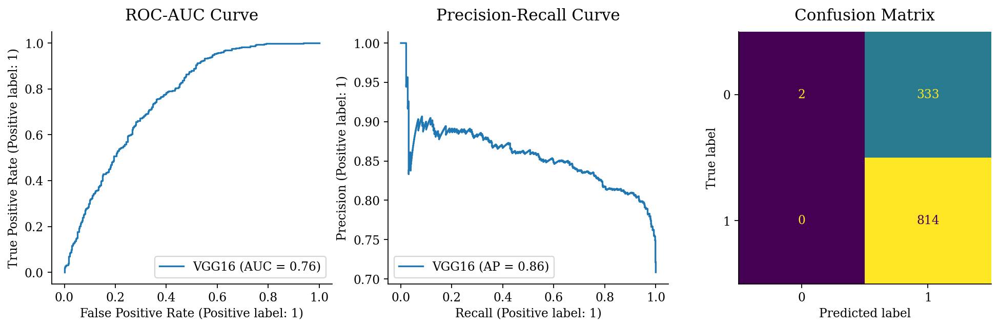

In [42]:
evaluate_model(vgg16_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step
Predicted: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Actual:    [1 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1 1 0 1 1]


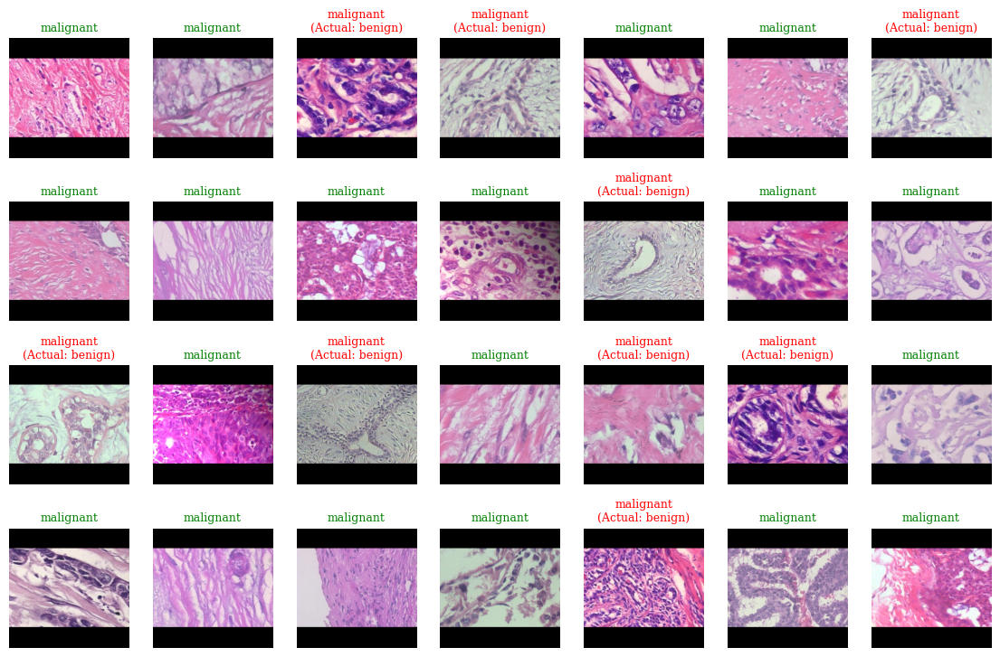

In [43]:
plot_predictions(vgg16_model)

In [44]:
pretrained_resnet_base = tf.keras.applications.resnet_v2.ResNet50V2(
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    weights="imagenet",
    pooling="avg",
)
pretrained_resnet_base.trainable = False

resnet_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),
    # ResNet
    layers.Lambda(tf.keras.applications.resnet_v2.preprocess_input),
    pretrained_resnet_base,
    layers.Dropout(0.4),
    # Fully connected layers
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(32, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(1, activation="sigmoid")
], name="ResNet50V2")
resnet_model.summary()

Model: "ResNet50V2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_brightness_6                  │ (None, 224, 224, 3)         │               0 │
│ (RandomBrightness)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip_6 (RandomFlip)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_6 (RandomRotation)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda_2 (Lambda)                    │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50v2 (Functional)              │ (None, 2048)                │      23,564,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 256)                 │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 32)                  │           8,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,097,601 (91.93 MB)

 Trainable params: 532,801 (2.03 MB)

 Non-trainable params: 23,564,800 (89.89 MB)

Epoch 1/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 506s 5s/step - binary_accuracy: 0.7101 - loss: 0.9342 - roc_auc: 0.4326 - val_binary_accuracy: 0.7972 - val_loss: 0.5218 - val_roc_auc: 0.8085 - learning_rate: 0.0010
Epoch 2/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 485s 5s/step - binary_accuracy: 0.7291 - loss: 0.5567 - roc_auc: 0.7485 - val_binary_accuracy: 0.8042 - val_loss: 0.4732 - val_roc_auc: 0.8134 - learning_rate: 0.0010
Epoch 3/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 489s 5s/step - binary_accuracy: 0.8215 - loss: 0.4315 - roc_auc: 0.8224 - val_binary_accuracy: 0.7842 - val_loss: 0.4556 - val_roc_auc: 0.8230 - learning_rate: 0.0010
Epoch 4/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 484s 5s/step - binary_accuracy: 0.7841 - loss: 0.4635 - roc_auc: 0.8356 - val_binary_accuracy: 0.7876 - val_loss: 0.4560 - val_roc_auc: 0.8267 - learning_rate: 0.0010
Epoch 5/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 490s 5s/step - binary_accuracy: 0.8396 - loss: 0.3742 - roc_auc: 0.8864 - val_binary_accuracy: 0.7459 - val_loss: 0.5566 - val_roc_auc: 0

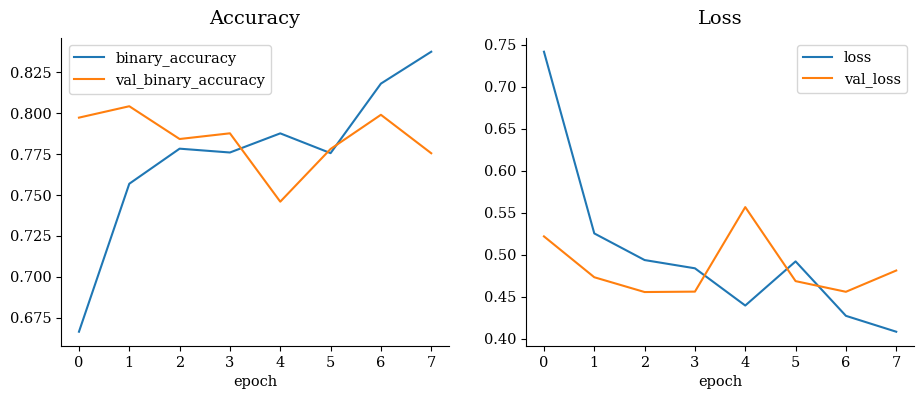

In [45]:
resnet_history = compile_and_fit_model(resnet_model)


ROC-AUC:   0.82299
Accuracy:  0.78416
Loss:      0.45556



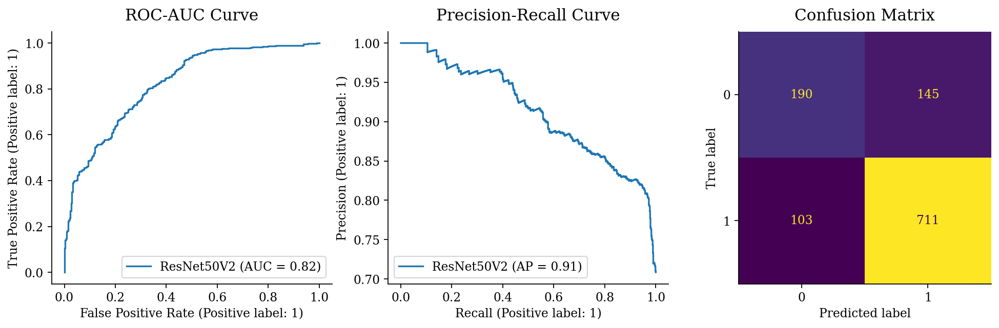

In [46]:
evaluate_model(resnet_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted: [1 1 1 0 1 1 0 1 1 1 1 0 1 1 1 1 0 1 1 1 0 1 1 1 0 1 0 1]
Actual:    [1 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1 1 0 1 1]


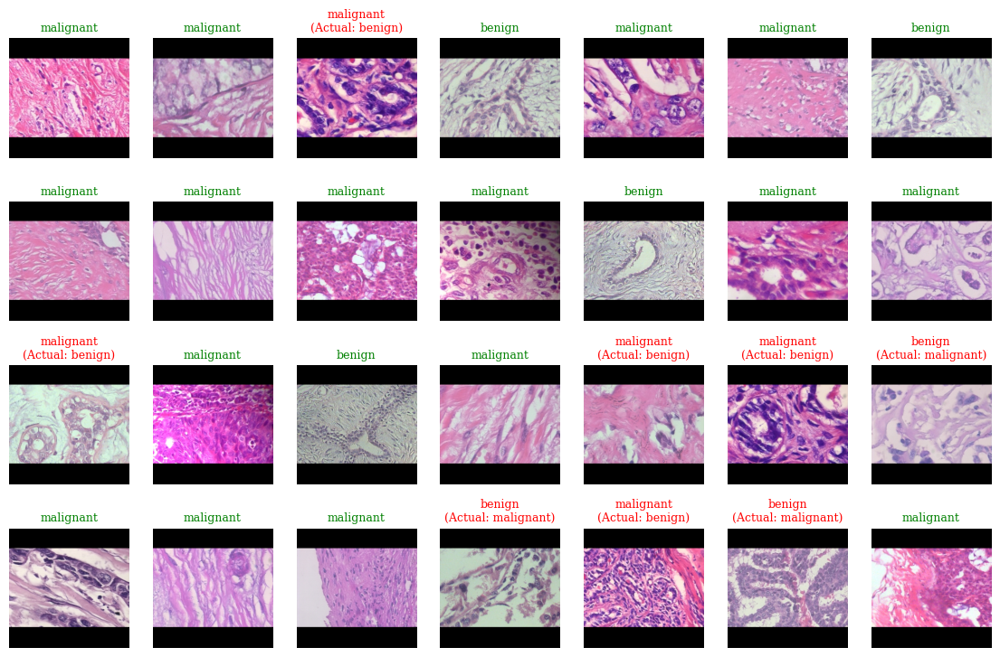

In [47]:
plot_predictions(resnet_model)

In [48]:
fitted_models = [custom_model, lstm_model, mobnet_model, efficientnet_model, vgg16_model,
                 resnet_model]
test_metrics = pd.DataFrame(
    {model.name: model.evaluate(test_ds, verbose=0) for model in fitted_models},
    index=["Loss", "ROC-AUC", "Accuracy"]
)
test_metrics.style.highlight_min(color="gold", axis=None)\
                  .highlight_max(color="lawngreen", axis=None)

,CustomCNN,sequential,MobileNetV3,EfficientNetB1,VGG16,ResNet50V2
Loss,0.551755,0.607357,0.552087,0.442579,0.562417,0.455563
ROC-AUC,0.825696,0.500000,0.742431,0.876660,0.759201,0.822995
Accuracy,0.827676,0.708442,0.726719,0.796345,0.710183,0.784160


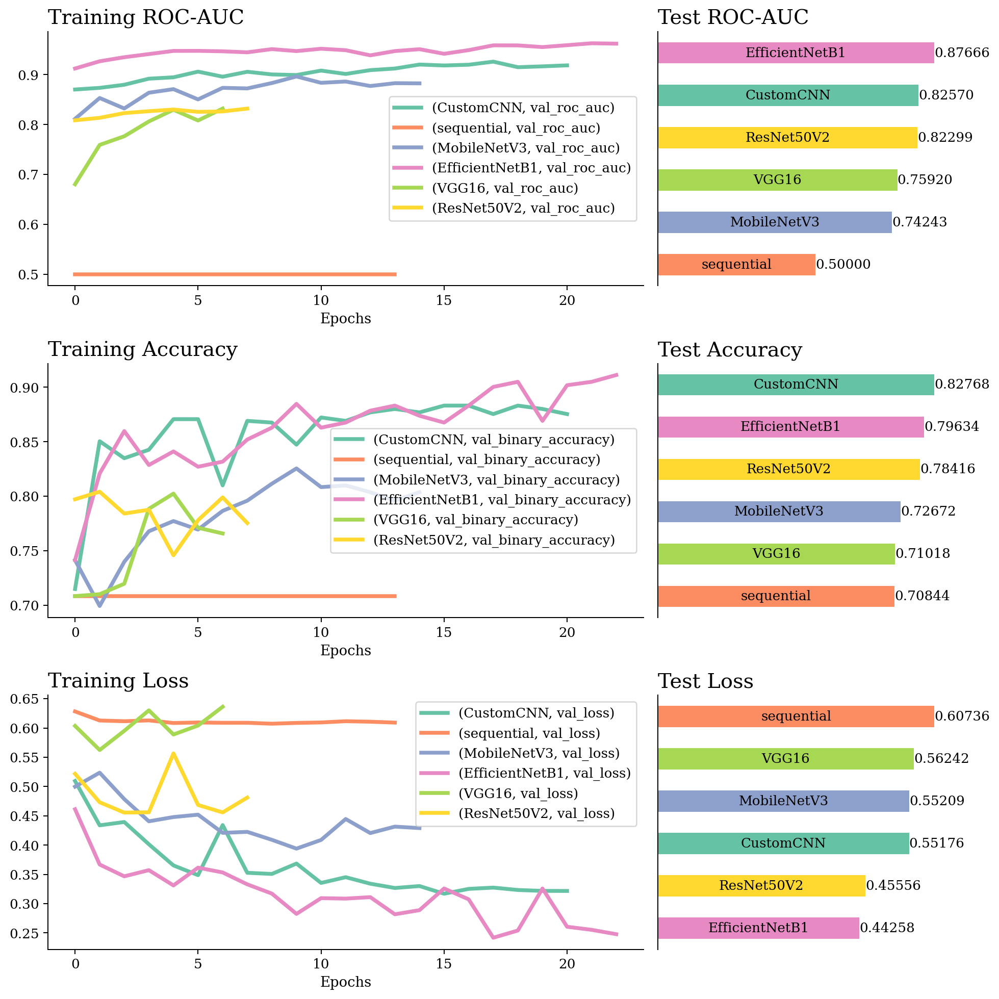

In [49]:
# Process training metrics
hist_list = [custom_history, lstm_history, mobnet_history, efficientnet_history,
             vgg16_history, resnet_history]
train_metrics = pd.concat([pd.DataFrame(hist.history) for hist in hist_list],
                          axis=1, keys=[hist.model.name for hist in hist_list])
train_metrics.head()
color_dict = dict(zip(test_metrics, plt.colormaps["Set2"].colors))

# Plot training and test metrics
fig, axes = plt.subplot_mosaic("\naab\nccd\neef\n", figsize=(11, 11),
                               dpi=180, tight_layout=True)
for ax, metric in zip([axes["a"], axes["c"], axes["e"]],
                      ["val_roc_auc", "val_binary_accuracy", "val_loss"]):
    data_ = train_metrics.filter(like=metric)
    data_.plot(ax=ax, lw=3, color=[color_dict[col]
                                   for col in data_.columns.levels[0]])
    ax.set_xlabel("Epochs", size=11)

for ax, metric in zip([axes["b"], axes["d"], axes["f"]],
                      ["ROC-AUC", "Accuracy", "Loss"]):
    data_ = test_metrics.loc[metric].sort_values()
    data_.plot.barh(ax=ax, color=[color_dict[col] for col in data_.index])
    ax.bar_label(ax.containers[0], [f"{x:.5f}" for x in ax.containers[0].datavalues])
    ax.bar_label(ax.containers[0], data_.index, label_type="center")
    ax.yaxis.set_visible(False)
    ax.xaxis.set_visible(False)
    ax.spines["bottom"].set_visible(False)

titles = ["Training ROC-AUC", "Test ROC-AUC", "Training Accuracy", "Test Accuracy",
          "Training Loss", "Test Loss"]
for ax, title in zip(axes.values(), titles):
    ax.set_title(title, size=16, loc="left")
    
axes["a"].legend(title="")
axes["c"].legend(title="")
axes["e"].legend(title="");

In [50]:
def get_predictions_and_labels(dataset: tf.data.Dataset) -> Tuple:
    # Get labels and predictions for each batch in dataset
    results = [(labels, [model.predict(images, verbose=0).reshape(-1,)
                         for model in fitted_models])
               for images, labels in dataset.take(-1)]
    labels = np.concatenate([x[0] for x in results])
    # Combine predictions, then transpose to shape (nsamples, nmodels)
    preds = np.concatenate([x[1] for x in results], axis=1).transpose()
    return preds, labels


train_preds, train_labels = get_predictions_and_labels(train_ds)
valid_preds, valid_labels = get_predictions_and_labels(validation_ds)
test_preds, test_labels = get_predictions_and_labels(test_ds)

In [51]:
stacking_model = LogisticRegressionCV(scoring="roc_auc")
stacking_model.fit(train_preds, train_labels)
stacked_preds = stacking_model.predict_proba(test_preds)

test_metrics["Stacking Ensemble"] = [
    metrics.log_loss(test_labels, stacked_preds),
    metrics.roc_auc_score(test_labels,
                          stacked_preds[:, 1]), # get stacked +ve probability
    metrics.accuracy_score(test_labels,
                           stacked_preds.argmax(axis=1)) # get stacked predicted label
]
test_metrics.style.highlight_min(color="gold", axis=None)\
                  .highlight_max(color="lawngreen", axis=None)

,CustomCNN,sequential,MobileNetV3,EfficientNetB1,VGG16,ResNet50V2,Stacking Ensemble
Loss,0.551755,0.607357,0.552087,0.442579,0.562417,0.455563,0.492265
ROC-AUC,0.825696,0.500000,0.742431,0.876660,0.759201,0.822995,0.878525
Accuracy,0.827676,0.708442,0.726719,0.796345,0.710183,0.784160,0.814621


In [52]:
import pandas as pd
test_metrics_df = pd.DataFrame(test_metrics, index=["Log Loss", "ROC AUC", "Accuracy"])
test_metrics_df.style.highlight_min(color="gold", axis=None).highlight_max(color="lawngreen", axis=None)

,CustomCNN,sequential,MobileNetV3,EfficientNetB1,VGG16,ResNet50V2,Stacking Ensemble
Log Loss,nan,nan,nan,nan,nan,nan,nan
ROC AUC,nan,nan,nan,nan,nan,nan,nan
Accuracy,0.827676,0.708442,0.726719,0.796345,0.710183,0.784160,0.814621


In [53]:
# Store models for deployment
model_filenames = [
    ("custom_cnn.keras", custom_model),
    ("mobnetv3sm.keras", mobnet_model),
    ("efficientnetv2B1.keras", efficientnet_model),
    ("vgg16.keras", vgg16_model),
    ("resnet50v2.keras", resnet_model),
    ("lstm.keras", lstm_model)
]

for filename, model in model_filenames:
    model.save(filename)

In [54]:
import os
# Check file sizes using Python
for filename, _ in model_filenames:
    size = os.path.getsize(filename)
    print(f"{filename}: {size / (1024 * 1024):.2f} MB")

custom_cnn.keras: 1.60 MB
mobnetv3sm.keras: 14.97 MB
efficientnetv2B1.keras: 31.35 MB
vgg16.keras: 58.77 MB
resnet50v2.keras: 96.61 MB
lstm.keras: 1.83 MB
